In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.neural_network import BernoulliRBM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import root_mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# 1

In [2]:
t = np.linspace(0, 4 * np.pi, 1500)
y = np.sin(t)

In [3]:
n_points = 100
x = np.array([y[i:i + n_points] for i in range(len(y) - n_points)])

In [4]:
scaler = MinMaxScaler(feature_range=(0, 1))
x = scaler.fit_transform(x)

In [5]:
rbm = BernoulliRBM(n_components=50, learning_rate=0.01, batch_size=32, n_iter=500)
rbm.fit(x)

BernoulliRBM(batch_size=32, learning_rate=0.01, n_components=50, n_iter=500)

In [ ]:
y_pred = np.zeros_like(y)
N = 50

for k in range(N):
    x_pred = rbm.gibbs(x)
    x_pred = scaler.inverse_transform(x_pred)

    for i in range(len(y)):
        indices = [j for j in range(len(x_pred)) if 0 <= i - j < n_points] # топологический шарик
        point_vals = [x_pred[j][i - j] for j in indices]
        y_pred[i] += (np.mean(point_vals))

y_pred = y_pred / N

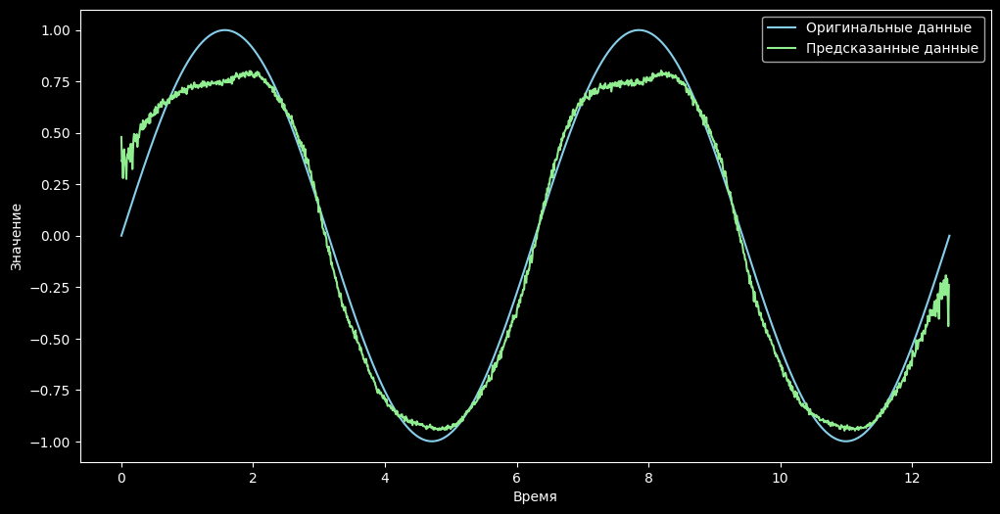

In [7]:
plt.figure(figsize=(12, 6))

plt.plot(t, y, label='Оригинальные данные', color='skyblue')

plt.plot(t[:len(y_pred)], y_pred, label='Предсказанные данные', color='lightgreen')

plt.xlabel('Время')
plt.ylabel('Значение')

plt.legend()

plt.show()

In [8]:
valid_indices = ~np.isnan(y_pred)

rmse = root_mean_squared_error(y[valid_indices], np.array(y_pred)[valid_indices])
r2 = r2_score(y[valid_indices], np.array(y_pred)[valid_indices])

print(f"RMSE: {rmse:.4f}, R2: {r2}")

RMSE: 0.1141, R2: 0.9739849947898926


# 2

In [9]:
df = pd.read_csv('data/ratings_small.csv')
df['movieId'] = df['movieId'].astype(str) # надо для мерджа
df.head()

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205


In [10]:
user_movie_matrix = df.pivot_table(index='userId', columns='movieId', values='rating')
user_movie_matrix

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
scaler = MinMaxScaler(feature_range=(0, 1))
user_movie_matrix = pd.DataFrame(scaler.fit_transform(user_movie_matrix), 
                                 columns=user_movie_matrix.columns, index=user_movie_matrix.index)

In [12]:
user_movie_matrix = user_movie_matrix.fillna(0)
user_movie_matrix

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
668,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
669,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
train, test = train_test_split(user_movie_matrix, test_size=0.2, random_state=42)

In [18]:
rbm = BernoulliRBM(n_components=50, learning_rate=0.01, batch_size=32, n_iter=500)
rbm.fit(train)

BernoulliRBM(batch_size=32, learning_rate=0.01, n_components=50, n_iter=500)

In [19]:
movies = pd.read_csv('data/movies_metadata.csv') # Подгрузил ради заголовка
movies.head()

C:\Users\User\AppData\Local\Temp\ipykernel_20756\4209957839.py:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  movies = pd.read_csv('data/movies_metadata.csv') # Подгрузил ради заголовка


,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [44]:
def predict_rating(user_id, user_movie_matrix, N=50):
    user_vector = user_movie_matrix.loc[user_id].values.reshape(1, -1)
    
    predicted_ratings = np.zeros_like(user_vector)
    for _ in range(N):
        y_pred = rbm.gibbs(user_vector)
        y_pred = scaler.inverse_transform(y_pred)
        predicted_ratings += y_pred
    return predicted_ratings[0] / N

all_true = []
all_pred = []

for user_id in test.index:
    user_ratings = df[df['userId'] == int(user_id)]
    common_movies = list(set(user_ratings['movieId']) & set(test.columns))
    
    if not common_movies:
        continue

    true_ratings = user_ratings[user_ratings['movieId'].isin(common_movies)].sort_values('movieId')['rating'].values

    pred_ratings = predict_rating(user_id, test)
    movie_indices = [test.columns.get_loc(m) for m in common_movies]
    pred_ratings = pred_ratings[movie_indices]
    
    all_true.extend(true_ratings)
    all_pred.extend(pred_ratings)


rmse = root_mean_squared_error(all_true, all_pred)
r2 = r2_score(all_true, all_pred)
print(f"RMSE: {rmse:.4f}")
print(f"R2 Score: {r2:.4f}")

RMSE: 2.2746
R2 Score: -3.4494


Модель не справляется. Мало данных в датасете.

## Пример рекомендации пользователю

In [ ]:
def get_rec(user_id, data, N=50):
    user_vector = data.loc[user_id].values.reshape(1, -1)
    
    predicted_ratings = np.zeros_like(user_vector)
    for _ in range(N):
        y_pred = rbm.gibbs(user_vector)
        y_pred = scaler.inverse_transform(y_pred)
        predicted_ratings += y_pred.flatten()
    predicted_ratings = predicted_ratings.flatten() / N
    
    recommendations = pd.DataFrame({
        'movieId': data.columns,
        'predicted_rating': predicted_ratings
    })
    
    recommendations = pd.merge(recommendations, movies, left_on='movieId', right_on='id', how='left')
    
    recommendations = recommendations.sort_values('predicted_rating', ascending=False)
    
    return recommendations

In [23]:
user_id = 1

In [ ]:
recommendations = get_rec(user_id, user_movie_matrix)
print(f"Предсказание оценок пользователя {user_id}:")
recommendations

Предсказание оценок пользователя 1:


,movieId,predicted_rating,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
3984,3845,5.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8769,93324,5.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
647,118890,5.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4172,40226,5.02,False,NaN,0,"[{'id': 27, 'name': 'Horror'}, {'id': 28, 'nam...",NaN,40226,tt0303970,en,...,2002-01-01,0.0,112.0,"[{'iso_639_1': 'cn', 'name': '广州话 / 廣州話'}]",Released,Five heroes. A coven of vampires. A lot of bad...,The Era of Vampires,False,6.0,6.0
3813,36931,5.00,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 28, 'name...",NaN,36931,tt0845464,en,...,2006-08-31,0.0,88.0,"[{'iso_639_1': 'cn', 'name': '广州话 / 廣州話'}]",Released,NaN,On the Edge,False,5.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4026,3895,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5743,54910,0.50,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,54910,tt0479965,en,...,2006-12-08,0.0,90.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Off the Black,False,6.0,1.0
4080,39408,0.50,False,"{'id': 221537, 'name': 'Creature From The Blac...",0,"[{'id': 27, 'name': 'Horror'}, {'id': 878, 'na...",NaN,39408,tt0049103,en,...,1956-04-26,0.0,79.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,A City Screams in Terror!,The Creature Walks Among Us,False,5.5,12.0
5680,54272,0.50,False,"{'id': 96887, 'name': 'Zatôichi: The Blind Swo...",0,"[{'id': 12, 'name': 'Adventure'}, {'id': 28, '...",NaN,54272,tt0164984,ja,...,1964-12-30,0.0,86.0,"[{'iso_639_1': 'ja', 'name': '日本語'}]",Released,NaN,Adventures of Zatôichi,False,6.3,10.0


In [26]:
print(f'Пользователю {user_id} может понравиться:')
recommendations[recommendations['predicted_rating'] > 4.5][['movieId', 'predicted_rating', 'title']]

Пользователю 1 может понравиться:


,movieId,predicted_rating,title
3984,3845,5.02,NaN
8769,93324,5.02,NaN
647,118890,5.02,NaN
4172,40226,5.02,The Era of Vampires
3813,36931,5.00,On the Edge
...,...,...,...
4122,39768,4.52,Beware of the Car!
6997,6883,4.52,Two-Minute Warning
4584,44197,4.52,NaN
6130,5888,4.52,NaN
